<a href="https://colab.research.google.com/github/MayaMM99/IST-718/blob/master/covid_19_pynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### COVID-19 mobility + CoreData.csv + more

In [0]:
import pandas as pd
#! pip install wget
#import wget
# code reference 
import numpy as np
# Import
# ======

# essential libraries
import math
import random
from datetime import timedelta
from urllib.request import urlopen
import json

# storing and anaysis
import numpy as np
import pandas as pd

# visualization
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import matplotlib
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'
from pandas.plotting import register_matplotlib_converters
import seaborn as sns
sns.set_palette("Paired")
sns.set_style("whitegrid")
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
# import calmap
import folium

# color pallette
cnf, dth, rec, act = '#bce784', '#5dd39e', '#348aa7', '#513b56' 

# converter
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()   

# hide warnings
import warnings
warnings.filterwarnings('ignore')

# to USA states details
!pip install us
import us

#!pip install -U plotly # plots won`t work without updating it 

# predictions
from fbprophet import Prophet
from sklearn.metrics import mean_squared_error
from math import sqrt
import scipy 
#scipy.version.full_version
import scipy.stscipy.sth
import pylab

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

from statsmodels.tsa.arima_model import ARIMA 
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.tsa.arima_model import ARIMAResults

from pandas import Series
from statistics import mean
from statistics import median
from math import sqrt
import math

import itertools
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 50)
pd.set_option('display.max_rows', 300)
from google.colab import files


import statsmodels.api as sm  # statistical models (including regression)
import statsmodels.formula.api as smf  # R-like model specification

from scipy.stats import boxcox
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.stattools import pacf

!pip install pmdarima
import pmdarima as pm
from pmdarima.arima import auto_arima

pd.plotting.register_matplotlib_converters() 


![alt text](https://media.giphy.com/media/Qu1fT51CG14ksIkASL/giphy.gif)

Data has been preprocessed  and cleaned prior importing. (https://colab.research.google.com/drive/1wabD0uZmseo84UZ6pgQhYBrNUdu6gt5Y#scrollTo=fIoCPA1Tm6VS)

In [0]:
df_mobility = pd.read_csv('https://raw.githubusercontent.com/MayaMM99/IST-718/master/FP/data/Global_Mobility_Report.csv')
df_core = pd.read_csv('https://raw.githubusercontent.com/MayaMM99/IST-718/master/FP/data/CoreData.csv')

In [154]:
df_mobility.isna().sum() # only this one have to be cleanes 

country_region_code                                       85
country_region                                             0
sub_region_1                                           11220
sub_region_2                                          110756
date                                                       0
retail_and_recreation_percent_change_from_baseline     64008
grocery_and_pharmacy_percent_change_from_baseline      72496
parks_percent_change_from_baseline                    190119
transit_stations_percent_change_from_baseline         156777
workplaces_percent_change_from_baseline                11263
residential_percent_change_from_baseline              147564
dtype: int64

In [155]:
df_mobility.head(2)

,country_region_code,country_region,sub_region_1,sub_region_2,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
0,AE,United Arab Emirates,NaN,NaN,2/15/2020,0.0,4.0,5.0,0.0,2.0,1.0
1,AE,United Arab Emirates,NaN,NaN,2/16/2020,1.0,4.0,4.0,1.0,2.0,1.0


In [0]:
df_core.drop(df_core.columns[[0]], axis = 1, inplace = True) 
df_core.head(2)



,Date,State,State_abb,Lat,Lon,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,Testing_Rate,Hospitalization_Rate
0,1/22/2020,Washington,WA,46.690978,-119.320774,1,0,0,0,0.0,0,0,0.0,0.0,0.0
1,1/23/2020,Washington,WA,46.690978,-119.320774,1,0,0,0,0.0,0,0,0.0,0.0,0.0


In [0]:
## Aggredate
df_agr = df_core.groupby(['Date','State','State_abb'])['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
df_agr.head(2)

,Date,State,State_abb,Confirmed,Deaths,Recovered,Active
0,1/22/2020,Washington,WA,1,0,0,0
1,1/23/2020,Washington,WA,1,0,0,0


Add  New cases, New deaths and New recovered by deducting the corresponding accumulative data on the previous day

In [0]:
# new cases 
temp = df_agr.groupby(['State', 'Date', ])['Confirmed', 'Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()
mask = temp['State'] != temp['State'].shift(1)
temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan
temp.loc[mask, 'Recovered'] = np.nan

# renaming columns
temp.columns = ['State', 'Date', 'New cases', 'New deaths', 'New recovered']

# merging new values
df_agr = pd.merge(df_agr, temp, on=['State', 'Date'])

# filling na with 0
df_agr = df_agr.fillna(0)

# fixing data types
cols = ['New cases', 'New deaths', 'New recovered']
df_agr[cols] = df_agr[cols].astype('int')
# 
df_agr['New cases'] = df_agr['New cases'].apply(lambda x: 0 if x<0 else x)

In [0]:
df_agr.head(2)

,Date,State,State_abb,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered
0,1/22/2020,Washington,WA,1,0,0,0,0,0,0
1,1/23/2020,Washington,WA,1,0,0,0,0,0,0


In [0]:
df = df_core.copy()
df1 = df_agr.copy()

In [0]:
# Confirmed cases over time 
melt_df = pd.melt(df1, id_vars = ['Date'], value_vars= ['Confirmed', 'Deaths', 'New cases', 'New deaths'])
melt_df

,Date,variable,value
0,1/22/2020,Confirmed,1
1,1/23/2020,Confirmed,1
2,1/24/2020,Confirmed,1
3,1/25/2020,Confirmed,1
4,1/25/2020,Confirmed,1
...,...,...,...
14871,5/9/2020,New deaths,43
14872,5/9/2020,New deaths,14
14873,5/9/2020,New deaths,1
14874,5/9/2020,New deaths,10


In [0]:
## Change the date format
df = df_core.copy()
df1 = df_agr.copy()
df['Date'] = pd.to_datetime(df['Date'])
df1['Date'] = pd.to_datetime(df1['Date'])
temp = df.groupby('Date')['Recovered', 'Deaths', 'Active'].sum().reset_index()
temp = temp.melt(id_vars="Date", value_vars=['Recovered', 'Deaths', 'Active'],
                 var_name='Case', value_name='Count')
temp.head()

fig = px.area(temp, x="Date", y="Count", color='Case', height=600,
             title='Cases over time', color_discrete_sequence = [rec, dth, act])
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [0]:
# Need fips for ploting!!!!
#"https://github.com/priya-dwivedi/Deep-Learning/blob/master/COVID19_Plotly_Visualization/COVID-19_visualizations-plotly.ipynb"
!git clone https://github.com/nytimes/covid-19-data.git

fatal: destination path 'covid-19-data' already exists and is not an empty directory.


In [0]:
df_us = pd.read_csv('covid-19-data/us-counties.csv')
df_us['new_date'] = pd.to_datetime(df_us['date'])
df_us['Year-Week'] = df_us['new_date'].dt.strftime('%Y-%U')
df_us.head()

,date,county,state,fips,cases,deaths,new_date,Year-Week
0,2020-01-21,Snohomish,Washington,53061.0,1,0,2020-01-21,2020-03
1,2020-01-22,Snohomish,Washington,53061.0,1,0,2020-01-22,2020-03
2,2020-01-23,Snohomish,Washington,53061.0,1,0,2020-01-23,2020-03
3,2020-01-24,Cook,Illinois,17031.0,1,0,2020-01-24,2020-03
4,2020-01-24,Snohomish,Washington,53061.0,1,0,2020-01-24,2020-03


In [0]:
df_us_week = df_us_week.sort_values(by=['Year-Week'])
fig = px.choropleth(df_us_week, geojson=counties, locations='fips', color='cases',
                           color_continuous_scale=px.colors.sequential.OrRd,
                           title = "Total Weekly Cases by Counties",
                           scope="usa",
                           animation_frame='Year-Week',
                          )
fig["layout"].pop("updatemenus")
fig.show()

In [0]:
us_state_abbrev = {
    'Alabama': 'AL',
    'Alaska': 'AK',
    'American Samoa': 'AS',
    'Arizona': 'AZ',
    'Arkansas': 'AR',
    'California': 'CA',
    'Colorado': 'CO',
    'Connecticut': 'CT',
    'Delaware': 'DE',
    'District of Columbia': 'DC',
    'Florida': 'FL',
    'Georgia': 'GA',
    'Guam': 'GU',
    'Hawaii': 'HI',
    'Idaho': 'ID',
    'Illinois': 'IL',
    'Indiana': 'IN',
    'Iowa': 'IA',
    'Kansas': 'KS',
    'Kentucky': 'KY',
    'Louisiana': 'LA',
    'Maine': 'ME',
    'Maryland': 'MD',
    'Massachusetts': 'MA',
    'Michigan': 'MI',
    'Minnesota': 'MN',
    'Mississippi': 'MS',
    'Missouri': 'MO',
    'Montana': 'MT',
    'Nebraska': 'NE',
    'Nevada': 'NV',
    'New Hampshire': 'NH',
    'New Jersey': 'NJ',
    'New Mexico': 'NM',
    'New York': 'NY',
    'North Carolina': 'NC',
    'North Dakota': 'ND',
    'Northern Mariana Islands':'MP',
    'Ohio': 'OH',
    'Oklahoma': 'OK',
    'Oregon': 'OR',
    'Pennsylvania': 'PA',
    'Puerto Rico': 'PR',
    'Rhode Island': 'RI',
    'South Carolina': 'SC',
    'South Dakota': 'SD',
    'Tennessee': 'TN',
    'Texas': 'TX',
    'Utah': 'UT',
    'Vermont': 'VT',
    'Virgin Islands': 'VI',
    'Virginia': 'VA',
    'Washington': 'WA',
    'West Virginia': 'WV',
    'Wisconsin': 'WI',
    'Wyoming': 'WY'
}

In [0]:
# reference https://towardsdatascience.com/interactive-covid-19-visualizations-using-plotly-with-4-lines-of-code-fa33b334ab84
df_us_week['state_code'] = df_us_week['state'].map(us_state_abbrev)
df_us_week.head()

test = df_us_week[df_us_week.cases > 15000]
test

df_us_week = df_us_week.sort_values(by=['Year-Week'])
fig = px.choropleth(df_us_week, locations='state_code', color='cases',
                           color_continuous_scale=px.colors.sequential.OrRd,
                           hover_name = 'state_code',
                           locationmode = 'USA-states',
                           animation_frame="Year-Week",
                          )
fig.update_layout(
    title_text = 'Weekly Total Caeses by State', # Create a Title
    geo_scope='usa',  # Plot only the USA instead of globe
)
fig.show()  # Output the plot to the screen

In [0]:
df_us_week['state_code'] = df_us_week['state'].map(us_state_abbrev)
df_us_week.head()

test = df_us_week[df_us_week.deaths > 5000]
test

df_us_week = df_us_week.sort_values(by=['Year-Week'])
fig = px.choropleth(df_us_week, locations='state_code', color='deaths',
                           color_continuous_scale=px.colors.sequential.OrRd,
                           hover_name = 'state_code',
                           locationmode = 'USA-states',
                           animation_frame="Year-Week",
                          )
fig.update_layout(
    title_text = 'Weekly Total Deaths by State', # Create a Title
    geo_scope='usa',  # Plot only the USA instead of globe
)
fig.show()  # Output the plot to the screen

In [0]:
latest = df[df['Date'] == max(df['Date'])]
gr = latest.groupby('State')['Confirmed', 'Deaths'].sum().reset_index()
gr.head(3)

,State,Confirmed,Deaths
0,Alabama,13052,522
1,Alaska,401,10
2,Arizona,14906,747


In [0]:
code = []
for i in gr['State']:
    try:
        code.append(us.states.lookup(i).abbr)
    except:
        code.append('')
gr['Code'] = code

gr.head()

,State,Confirmed,Deaths,Code
0,Alabama,13052,522,AL
1,Alaska,401,10,AK
2,Arizona,14906,747,AZ
3,Arkansas,5003,107,AR
4,California,85997,3497,CA


In [0]:
import plotly.graph_objects as go
# Confirmed cases
fig = go.Figure(data=go.Choropleth(
    locations=gr['Code'], 
    z = gr['Confirmed'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'YlGnBu',
    colorbar_title = "Confirmed Cases",
))

fig.update_layout(
    title_text = 'COVID-19 Confirmed Cases',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [0]:
# Confirmed deaths
fig = go.Figure(data=go.Choropleth(
    locations=gr['Code'], # Spatial coordinates
    z = gr['Deaths'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'YlGnBu',
    colorbar_title = "Number of Deaths",
))

fig.update_layout(
    title_text = 'COVID-19 Number of Deaths',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [0]:
latest = df[df['Date'] == max(df['Date'])]
gr = latest.groupby('State')['Testing_Rate', 'Hospitalization_Rate'].sum().reset_index()
code = []
for i in gr['State']:
    try:
        code.append(us.states.lookup(i).abbr)
    except:
        code.append('')
gr['Code'] = code

gr.head()

,State,Testing_Rate,Hospitalization_Rate,Code
0,Alabama,3353.942386,11.438860,AL
1,Alaska,5063.940017,0.000000,AK
2,Arizona,2272.859351,12.022005,AZ
3,Arkansas,3189.670370,10.693584,AR
4,California,3492.893832,0.000000,CA


In [0]:
# Testing Rate
fig = go.Figure(data=go.Choropleth(
    locations=gr['Code'], 
    z = gr['Testing_Rate'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'YlGnBu',
    colorbar_title = "Testing Rate",
))

fig.update_layout(
    title_text = 'COVID-19 Testing Rate',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [0]:
# Hospitalization  Rate
fig = go.Figure(data=go.Choropleth(
    locations=gr['Code'], 
    z = gr['Hospitalization_Rate'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'YlGnBu',
    colorbar_title = "Hospitalization Rate",
))

fig.update_layout(
    title_text = 'COVID-19 Hospitalization Rate',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [0]:
## Total Confirmed Cases overtime #154,8591 COMULATIVE
df2 = df.groupby('Date').agg('sum')
df2.reset_index(inplace=True)
df2[['Date', 'Confirmed']]

,Date,Confirmed
0,2020-01-22,1
1,2020-01-23,1
2,2020-01-24,1
3,2020-01-25,2
4,2020-01-26,5
5,2020-01-27,5
6,2020-01-28,5
7,2020-01-29,5
8,2020-01-30,5
9,2020-01-31,6


Total confirmed cases for USA as of May 21st 2020 are 1,548,591.

In [0]:
fig_c = px.bar(df, x="Date", y="Confirmed", color_discrete_sequence = [act])
fig_d = px.bar(df, x="Date", y="Deaths", color_discrete_sequence = [dth])
fig_r = px.bar(df, x="Date", y="Recovered", color_discrete_sequence = [rec])

fig = make_subplots(rows=1, cols=3, shared_xaxes=False, horizontal_spacing=0.1,
                    subplot_titles=('Confirmed cases', 'Deaths reported', 
                                    'Recovered reported'))

fig.add_trace(fig_c['data'][0], row=1, col=1)
fig.add_trace(fig_d['data'][0], row=1, col=2)
fig.add_trace(fig_r['data'][0], row=1, col=3)


fig.update_layout(height=480)
fig.show()


# ===================================

fig_c = px.bar(df1, x="Date", y="New cases", color_discrete_sequence = [act])
fig_n = px.bar(df1, x="Date", y="New deaths", color_discrete_sequence = [dth])
fig_d = px.bar(df1, x="Date", y="Active", color_discrete_sequence = ['#333333'])

fig = make_subplots(rows=1, cols=3, shared_xaxes=False, horizontal_spacing=0.1,
                    subplot_titles=('No. of new cases everyday',
                                    'No. of new deaths everyday',
                                    'No. of active cases every day'))

fig.add_trace(fig_c['data'][0], row=1, col=1)
fig.add_trace(fig_c['data'][0], row=1, col=2)
fig.add_trace(fig_d['data'][0], row=1, col=3)

fig.update_layout(height=480)
fig.show()

In [0]:
# Make a char for each state
df.loc[:,["Confirmed","Deaths","State"]].groupby(["State"]).sum().sort_values("Confirmed",ascending=False).style.background_gradient(cmap='Blues',subset=["Confirmed"]).background_gradient(cmap='Reds',subset=["Deaths"])

,Confirmed,Deaths
State,,
New York,13425613,940993
New Jersey,5036763,289483
Massachusetts,2562931,141990
Illinois,2411743,102193
California,2277732,86449
Pennsylvania,2034424,105758
Michigan,1808358,150805
Florida,1523091,54228
Texas,1317106,34489


In [0]:
# Summay Map
# url = "https://raw.githubusercontent.com/Subhash9325/GeoJson-Data-of-Indian-States/master/Indian_States"
# state_json = requests.get(url).json()
df = df.replace(np.nan, 0, regex=True)
usa = folium.Map(location=[37, -102], zoom_start=4,max_zoom=9,min_zoom=4)

for i in np.int32(np.asarray(df[df['Confirmed'] > 0].index)):
    folium.Circle(
        location=[df.loc[i]['Lat'], df.loc[i]['Lon']],
        tooltip = "<h5 style='text-align:center;font-weight: bold'>"+df.loc[i]['State']+"</h5>"+
                    #"<div style='text-align:center;'>"+str(np.nan_to_num(df.loc[i]['County']))+"</div>"+
                    "<hr style='margin:10px;'>"+
                    "<ul style='color: #444;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"+
        "<li>Confirmed: "+str(df.loc[i]['Confirmed'])+"</li>"+
        "<li>Active:   "+str(df.loc[i]['Active'])+"</li>"+
        "<li>Recovered:   "+str(df.loc[i]['Recovered'])+"</li>"+       
        "<li>Deaths:   "+str(df.loc[i]['Deaths'])+"</li>"+
        "<li>Mortality Rate:   "+str(np.round(df.loc[i]['Deaths']/(df.loc[i]['Confirmed']+1)*100,2))+"</li>"+
        "</ul>"
        ,
        radius=int((np.log2(df.loc[i]['Confirmed']+1))*6000),
        color='#840032',
        fill_color='#e21d40',
        fill=True).add_to(usa)

usa

In [0]:
import requests
state_geo = requests.get('https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us-states.json').json()
county_geo = requests.get('https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us_counties_20m_topo.json').json()
# county_geo

In [0]:
data_temp = df.groupby(["State"]).sum().reset_index().drop(["Lat","Lon"],axis=1)
data_temp["Confirmed_log"] = np.log10(data_temp["Confirmed"]+1)
bins = list(data_temp['Confirmed_log'].quantile([0, 0.25, 0.5, 0.75,0.95 ,1]))
m = folium.Map(location=[37, -102], zoom_start=4,max_zoom=6,min_zoom=3)
 
# Add the color for the chloropleth:
folium.Choropleth(
    geo_data=state_geo,
    name='choropleth',
    data = data_temp,
    columns=['State', 'Confirmed_log'],
    key_on='feature.properties.name',
    fill_color='Reds',
    fill_opacity=0.7,
    line_opacity=0.2,
    bins = bins,
    reset=True,
    legend_name='Confirmed cases log (10^x)'
).add_to(m)
folium.LayerControl().add_to(m)

legend_html = "<div style='padding:10px;background-color:rgba(255,255,255,0.5);position:fixed;bottom:20px;left:20px;z-index:1000'>"
legend_html += "<div style='width:100%;text-align:center;'><h4>Index for Legend</h4></div><hr style='border-top-color: rgba(25,25,25,0.5);'>"
legend_html += "<ul style='margin:0;padding:0;color: #555;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"
for i in bins:
    legend_html += "<li style='margin:0;padding:0;line-height: 0;'>Value "+str(np.round(i,2))+" : "+str(int(10**i)-1)+"</li><br>"
legend_html += "</ul></div>"
m.get_root().html.add_child(folium.Element(legend_html))
m

In [0]:
df_us

,date,county,state,fips,cases,deaths,new_date,Year-Week
5000,2020-03-19,Abbeville,South Carolina,45001.0,1,0,2020-03-19,2020-11
5873,2020-03-20,Abbeville,South Carolina,45001.0,1,0,2020-03-20,2020-11
6877,2020-03-21,Abbeville,South Carolina,45001.0,1,0,2020-03-21,2020-11
7997,2020-03-22,Abbeville,South Carolina,45001.0,1,0,2020-03-22,2020-12
9208,2020-03-23,Abbeville,South Carolina,45001.0,1,0,2020-03-23,2020-12
...,...,...,...,...,...,...,...,...
161250,2020-05-20,Ziebach,South Dakota,46137.0,1,0,2020-05-20,2020-20
164202,2020-05-21,Ziebach,South Dakota,46137.0,1,0,2020-05-21,2020-20
167160,2020-05-22,Ziebach,South Dakota,46137.0,1,0,2020-05-22,2020-20
170122,2020-05-23,Ziebach,South Dakota,46137.0,1,0,2020-05-23,2020-20


In [0]:
# Confirmed cases by county
# binsurl = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
# county_data = f'{url}/us_county_data.csv'
# county_geo = f'{url}/us_counties_20m_topo.json'
import branca
from jinja2 import Template
from branca.element import ENV, Figure, JavascriptLink, MacroElement
from branca.utilities import legend_scaler

data_temp = df_us.groupby(["fips"]).sum().reset_index()
data_temp["Confirmed_log"] = np.log10(data_temp["cases"]+1)

df_usa_series = data_temp.set_index('fips')['Confirmed_log']
colorscale = branca.colormap.linear.Reds_09.scale(0,data_temp["Confirmed_log"].max()-1)
# print(df_usa_series.max())
def style_function(feature):
    employed = df_usa_series.get(int(feature['id'][-5:]), 0)
    return {
        'fillOpacity': 0.5,
        'weight': 0,
        'fillColor': '#black' if employed is None else colorscale(employed)
    }


m = folium.Map(
    location=[37, -102],
    tiles='cartodbpositron',
    zoom_start=4,
    min_zoom=3,
    max_zoom=7
)

folium.TopoJson(
    county_geo,
    'objects.us_counties_20m',
    style_function=style_function
).add_to(m)
m

The empty spaces on the map are missing informayion. Mapp is visualizing COVID-19 cases per county.

In [0]:
newest_date = df['Date'].max()

In [0]:
# find total confirmed and totoal death 
df3 = df[df['Date'] == newest_date].groupby('Date').agg(sum)
df3.reset_index(inplace=True)
df3

,Date,Lat,Lon,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,Testing_Rate,Hospitalization_Rate
0,2020-05-21,1995.835953,-4711.710023,1548591,93298,294113,1161180,21895.044567,12634629,161616,225.37982,206515.254103,473.303867


In [0]:
# Total cases per state 
df4 = df[df['Date'] == newest_date]

In [0]:
# Confirmed cases per state
df5 = df4.groupby('State').agg('sum').sort_values('Confirmed', ascending=False)
df5.reset_index(inplace=True)
df5[['State', 'Confirmed']].head(51)

,State,Confirmed
0,New York,354370
1,New Jersey,150776
2,Illinois,100418
3,Massachusetts,88970
4,California,85997
5,Pennsylvania,68126
6,Michigan,53009
7,Texas,51673
8,Florida,47471
9,Maryland,42323


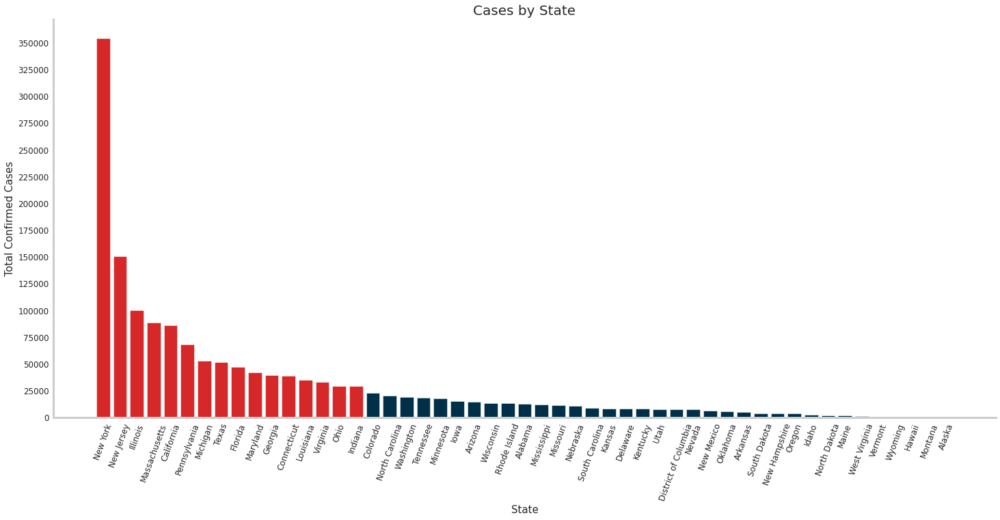

In [0]:
import plotly.io as pio
pio.templates.default = "plotly_white"

fig, ax = plt.subplots(figsize=(22,10))
ax.tick_params(axis='x', rotation=70)
ax.bar(df5['State'], df5['Confirmed'], color=(df5['Confirmed'] < 25000).map({True: '#003049',
                                                                          False: '#d62828'}))
ax.set_title('Cases by State', fontsize=20)
ax.set_ylabel('Total Confirmed Cases', fontsize=15)
ax.set_xlabel('State', fontsize=15)
y_max_cases = df5['Confirmed'].max()+1000
plt.yticks(np.arange(0, y_max_cases, step=25000))
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)
plt.grid()

States in red has over 25,000 cases. States with most cases are New York, New Jersey, Illinois, Massachusets, Caliifornia.

In [0]:
# Deaths  per state 
df5 = df4.groupby('State').agg('sum').sort_values('Deaths', ascending=False)
df5.reset_index(inplace=True)
df5[['State', 'Deaths']].head(51)

,State,Deaths
0,New York,28636
1,New Jersey,10749
2,Massachusetts,6066
3,Michigan,5060
4,Pennsylvania,4770
5,Illinois,4525
6,Connecticut,3529
7,California,3497
8,Louisiana,2608
9,Maryland,2123


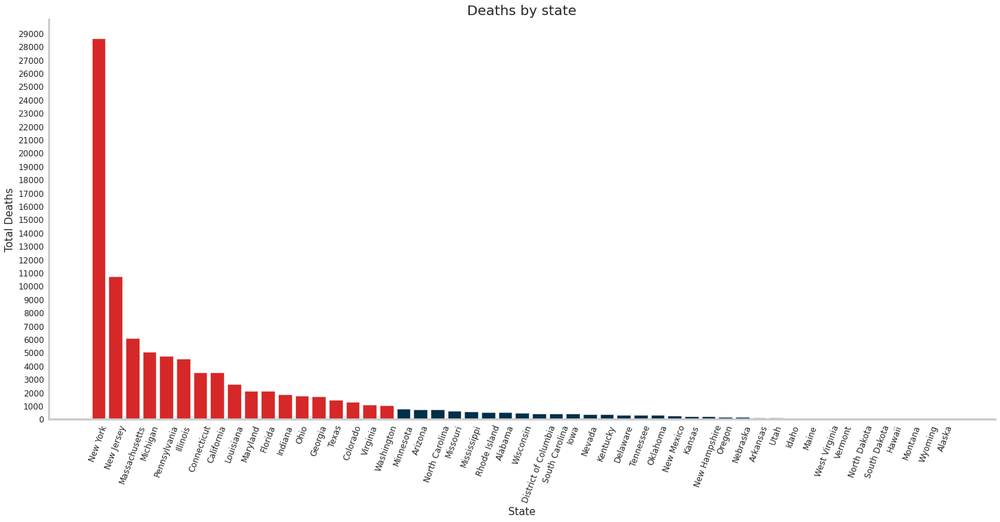

In [0]:
fig, ax = plt.subplots(figsize=(22,10))
ax.tick_params(axis='x', rotation=70)
ax.bar(df5['State'], df5['Deaths'], color=(df5['Deaths'] < 1000).map({True: '#003049',
                                                                          False: '#d62828'}))
ax.set_title('Deaths by state', fontsize=20)
ax.set_ylabel('Total Deaths', fontsize=15)
ax.set_xlabel('State', fontsize=15)
y_max_deaths = df5['Deaths'].max()+1000
plt.yticks(np.arange(0, y_max_deaths, step=1000))
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)
plt.grid()

States in red have over 1000 deaths. Top states are New York, New Jersey, Massachusetts, Michigan, Pensilvania. Michigan has more deaths than Clifornia, that had more caases. 

In [0]:
# Recovered  per state 
df5 = df4.groupby('State').agg('sum').sort_values('Recovered', ascending=False)
df5.reset_index(inplace=True)
df5[['State', 'Recovered']].head(10)

,State,Recovered
0,New York,61886
1,Texas,30341
2,Michigan,28234
3,Louisiana,26249
4,New Jersey,23945
5,Minnesota,12227
6,Tennessee,11783
7,North Carolina,11637
8,Iowa,8362
9,Wisconsin,7728


In [0]:
# People_Hospitalized  per state 
df5 = df4.groupby('State').agg('sum').sort_values('People_Hospitalized', ascending=False)
df5.reset_index(inplace=True)
df5[['State', 'People_Hospitalized']].head(51)

,State,People_Hospitalized
0,New York,76410
1,Connecticut,10946
2,Florida,8934
3,Massachusetts,8897
4,Maryland,7393
5,Georgia,7107
6,Virginia,6059
7,Ohio,5198
8,Indiana,4389
9,Colorado,3955


Florida and Conneticut have a lot of people hospitalized.

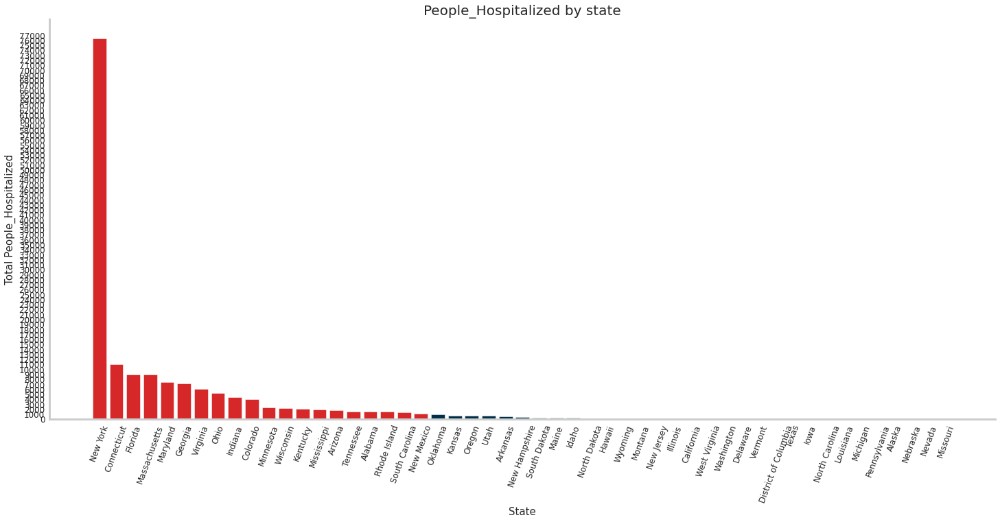

In [0]:
fig, ax = plt.subplots(figsize=(22,10))
ax.tick_params(axis='x', rotation=70)
ax.bar(df5['State'], df5['People_Hospitalized'], color=(df5['People_Hospitalized'] < 1000).map({True: '#003049',
                                                                          False: '#d62828'}))
ax.set_title('People_Hospitalized by state', fontsize=20)
ax.set_ylabel('Total People_Hospitalized', fontsize=15)
ax.set_xlabel('State', fontsize=15)
y_max_deaths = df5['People_Hospitalized'].max()+1000
plt.yticks(np.arange(0, y_max_deaths, step=1000))
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)
plt.grid()

In [0]:
# Find daily cases
df6 = df.groupby('Date').agg('sum')
df6['Cases_daily'] = df6['Confirmed'] - df6['Confirmed'].shift(1)
df6['Deaths_daily'] = df6['Deaths'] - df6['Deaths'].shift(1)
df6['Cases_daily'].fillna('0', inplace=True)
df6['Deaths_daily'].fillna('0', inplace=True)
df6['Cases_daily'] = df6['Cases_daily'].astype('int64')
df6['Deaths_daily'] = df6['Deaths_daily'].astype('int64')
df6.reset_index(inplace=True)
df6[['Date', 'Cases_daily']]

,Date,Cases_daily
0,2020-01-22,0
1,2020-01-23,0
2,2020-01-24,0
3,2020-01-25,1
4,2020-01-26,3
5,2020-01-27,0
6,2020-01-28,0
7,2020-01-29,0
8,2020-01-30,0
9,2020-01-31,1


From this data, the first case was on Jan 25th. Cases kept increasing with time. 

In [0]:
# Most infectious data
most_infectious_day = df6.groupby('Date').agg('sum').sort_values('Cases_daily', ascending=False)
most_infectious_day.reset_index(inplace=True)
most_infectious_day[['Date', 'Cases_daily']].head(1)

,Date,Cases_daily
0,2020-04-14,69069


In [0]:
# First ocuurance of death  - FEB 29TH!
df6[df6['Deaths']>0][['Date', 'Deaths']].head(2)

,Date,Deaths
22,2020-02-29,1
23,2020-03-01,1


In [0]:
# Most deaths day Apr 16th!!
deadliest_day = df6.groupby('Date').agg('sum').sort_values('Deaths_daily', ascending=False)
deadliest_day.reset_index(inplace=True)
deadliest_day[['Date', 'Deaths_daily']].head(1)

,Date,Deaths_daily
0,2020-04-16,4586


In [0]:
# Mortality rate - 6%
mortality_rate = df3['Deaths']/df3['Confirmed']*100
mortality_rate

0    6.024702
dtype: float64

In [0]:
# Mortality rate by states
# m rate by states 
df5['mortality rate'] = round((df5['Deaths']/df5['Confirmed'])*100, 2)
df5[['State', 'mortality rate']].head(10)

,State,mortality rate
0,New York,8.08
1,Connecticut,9.04
2,Florida,4.42
3,Massachusetts,6.82
4,Maryland,5.02
5,Georgia,4.26
6,Virginia,3.27
7,Ohio,6.05
8,Indiana,6.37
9,Colorado,5.70


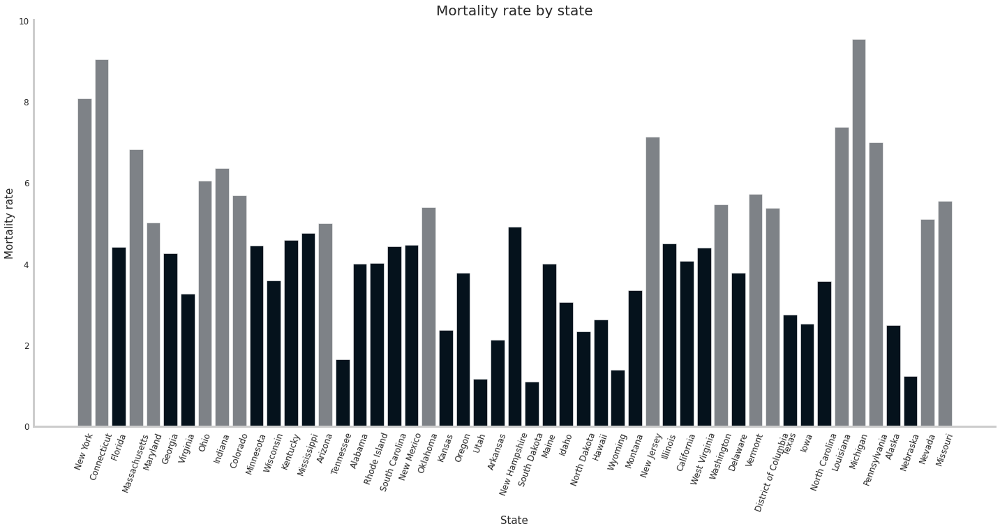

In [0]:
# Plot it
fig, ax = plt.subplots(figsize=(22,10))
ax.tick_params(axis='x', rotation=70)
ax.bar(df5['State'], df5['mortality rate'], color=(df5['mortality rate'] < 5).map({True: '#05121c',
                                                                          False: '#7e8287'}))
ax.set_title('Mortality rate by state', fontsize=20)
ax.set_ylabel('Mortality rate', fontsize=15)
ax.set_xlabel('State', fontsize=15)
ax.spines["top"].set_visible(False)  
ax.spines["right"].set_visible(False)
plt.grid()

In [0]:
fig = px.scatter(df5.sort_values('Deaths', ascending=False).iloc[:20, :], 
                 x='Confirmed', y='Deaths', color='State', size='Confirmed', height=700,
                 text='State', log_x=True, log_y=True, title='Deaths vs Confirmed (Scale is in log10)')
fig.update_traces(textposition='top center')
fig.update_layout(showlegend=False)
fig.update_layout(xaxis_rangeslider_visible=False)
fig.show()

Confirmed cases and deaths have positive correlation. 

In [0]:
# first
fig = px.line(df1, x="Date", y="Confirmed", color='State', height=600,
             title='Confirmed', color_discrete_sequence = px.colors.cyclical.Edge)
fig.show()


# secong
fig = px.line(df1, x="Date", y="Deaths", color='State', height=600,
             title='Deaths', color_discrete_sequence = px.colors.cyclical.Edge)
fig.show()


# third
fig = px.line(df1, x="Date", y="New cases", color='State', height=600,
             title='New cases', color_discrete_sequence = px.colors.cyclical.Edge)
fig.show()

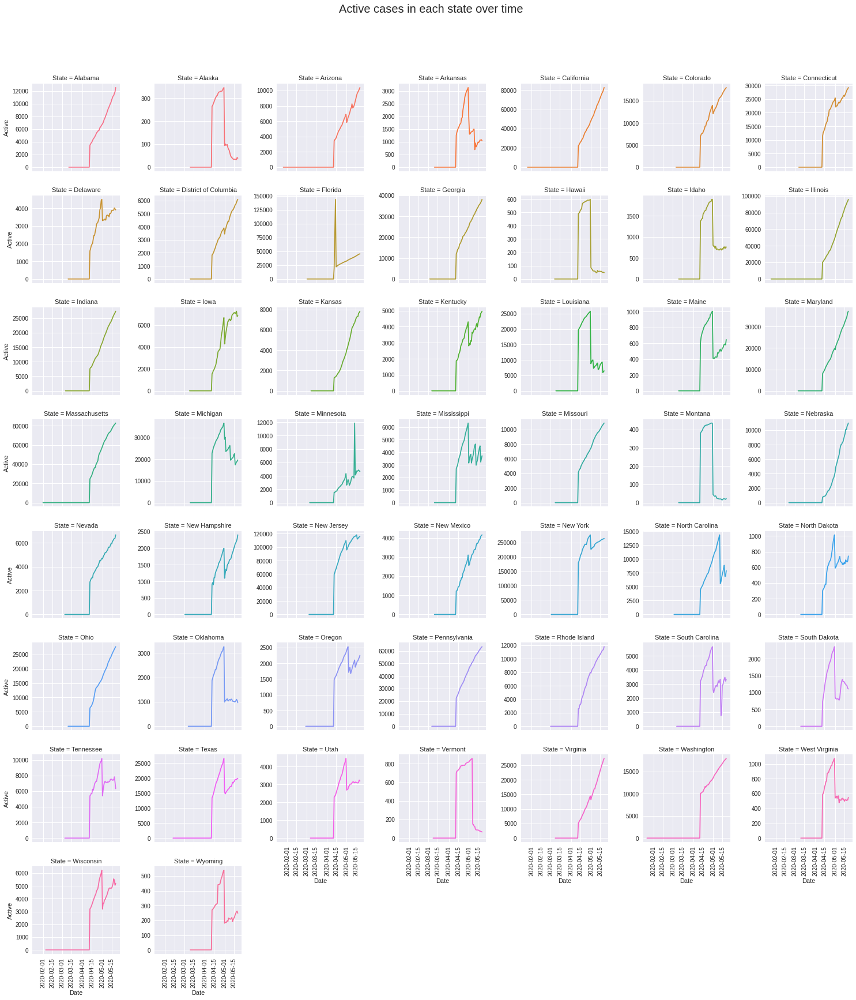

In [0]:
# Daily new Cases per state -  easier to see
plt.style.use('seaborn')
g = sns.FacetGrid(df1.sort_values(['State', 'Date']), 
                  col="State", hue="State", 
                  sharey=False, col_wrap=7)
g = g.map(plt.plot, "Date", "Active")
g.set_xticklabels(rotation=90)
g.fig.subplots_adjust(top=.9)
g.fig.suptitle('Active cases in each state over time', 
               fontsize=20)
plt.show()

Some states like West Virginia, Wyoming, Wisconsin, North Dakota, Arkansas and Alaska managed to flatten the curve.

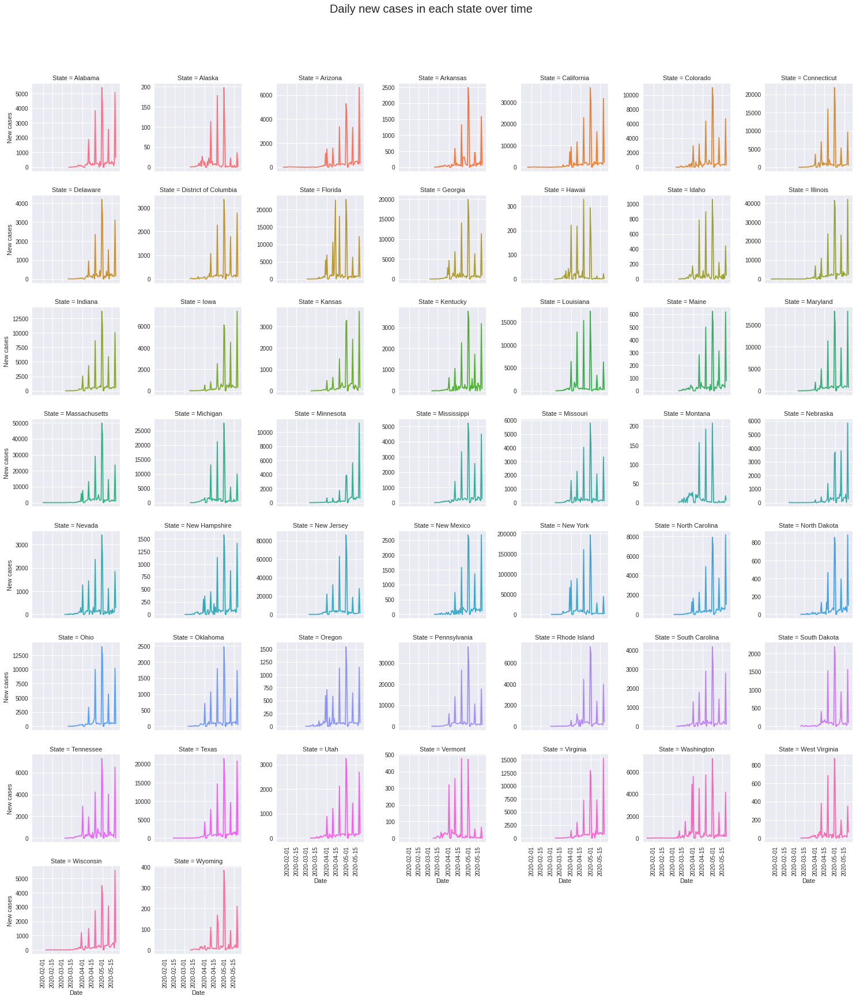

In [0]:
# New Cases per state
plt.style.use('seaborn')
g = sns.FacetGrid(df1.sort_values(['State', 'Date']), 
                  col="State", hue="State", 
                  sharey=False, col_wrap=7)
g = g.map(plt.plot, "Date", "New cases")
g.set_xticklabels(rotation=90)
g.fig.subplots_adjust(top=.9)
g.fig.suptitle('Daily new cases in each state over time', 
               fontsize=20)
plt.show()

The new cases per day are decreasing for most states.

In [0]:
# Latest cases
latest = df1[df1['Date'] == max(df1['Date'])]
latest.head(3)

,Date,State,State_abb,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered
3311,2020-05-21,Alabama,AL,13052,522,0,12530,676,18,0
3312,2020-05-21,Alaska,AK,401,10,352,39,1,0,4
3313,2020-05-21,Arizona,AZ,14906,747,3773,10386,330,42,80


In [0]:
"""! pip install plotly==4.5.2
import plotly.express as px
#!pip install -U plotly"""

latest = df1[df1['Date'] == max(df1['Date'])]
                         
fig = px.treemap(latest.sort_values(by='Confirmed', ascending=False).reset_index(drop=True), 
                 path=["State", "State_abb"], values="Confirmed", height=700,
                 title='Number of Confirmed Cases',
                 color_discrete_sequence = px.colors.qualitative.D3_r)
fig.data[0].textinfo = 'label+text+value'
fig.show()

fig = px.treemap(latest.sort_values(by='Deaths', ascending=False).reset_index(drop=True), 
                 path=["State_abb", "State"], values="Deaths", height=700,
                 title='Number of Deaths reported',
                 color_discrete_sequence = px.colors.qualitative.D3_r)
fig.data[0].textinfo = 'label+text+value'
fig.show()

Confirmed Cases
https://public.flourish.studio/visualisation/2498856/

In [0]:
from IPython.display import display, HTML
HTML('''<div class="flourish-embed flourish-bar-chart-race" data-src="visualisation/2498856" data-url="https://flo.uri.sh/visualisation/2498856/embed"><script src="https://public.flourish.studio/resources/embed.js"></script></div>''')

Confirmed Deaths https://public.flourish.studio/visualisation/2369371/

In [0]:
HTML('''<div class="flourish-embed flourish-bar-chart-race" data-src="visualisation/2369371" data-url="https://flo.uri.sh/visualisation/2369371/embed"><script src="https://public.flourish.studio/resources/embed.js"></script></div>''')

In [0]:
# Look at some states
fl = df1[df1['State'] == 'Florida']
tx = df1[df1['State'] == 'Texas']
wa = df1[df1['State'] == 'Washington']
ca = df1[df1['State'] == 'California']

In [0]:
# FL
import altair as alt
base = alt.Chart(fl).mark_bar().encode(
    x='monthdate(Date):O',
).properties(
    width=500
)
red = alt.value("#f54242")

base.encode(y='Confirmed').properties(title='Total confirmed')| base.encode(y='Deaths', color = red).properties(title = 'Total deaths')

alt.HConcatChart(...)

In [0]:
red = alt.value("#f54242")
base.encode(y='New cases').properties(title='Daily new cases')| base.encode(y='New deaths', color = red).properties(title = 'Daily new deaths')

alt.HConcatChart(...)

In [0]:
# TX
base = alt.Chart(tx).mark_bar().encode(
    x='monthdate(Date):O',
).properties(
    width=500
)
red = alt.value("#f54242")

base.encode(y='Confirmed').properties(title='Total confirmed')| base.encode(y='Deaths', color = red).properties(title = 'Total deaths')

alt.HConcatChart(...)

In [0]:
base.encode(y='New cases').properties(title='Daily new cases')| base.encode(y='New deaths', color = red).properties(title = 'Daily new deaths')

alt.HConcatChart(...)

In [0]:
# WA
base = alt.Chart(wa).mark_bar().encode(
    x='monthdate(Date):O',
).properties(
    width=500
)
red = alt.value("#f54242")

base.encode(y='Confirmed').properties(title='Total confirmed')| base.encode(y='Deaths', color = red).properties(title = 'Total deaths')

alt.HConcatChart(...)

In [0]:
base.encode(y='New cases').properties(title='Daily new cases')| base.encode(y='New deaths', color = red).properties(title = 'Daily new deaths')

alt.HConcatChart(...)

In [0]:
# CA
base = alt.Chart(ca).mark_bar().encode(
    x='monthdate(Date):O',
).properties(
    width=500
)
red = alt.value("#f54242")

base.encode(y='Confirmed').properties(title='Total confirmed')| base.encode(y='Deaths', color = red).properties(title = 'Total deaths')

alt.HConcatChart(...)

In [0]:
base.encode(y='New cases').properties(title='Daily new cases')| base.encode(y='New deaths', color = red).properties(title = 'Daily new deaths')

alt.HConcatChart(...)

In [0]:
## Add some states
states = ['New York', 'Illinois', 'Washington', 'California', 'Texas', 'Ohio', 'Delaware', 'Nevada', 'New Jersey']
selected_states = df1[df1['State'].isin(states)]

In [0]:
interval = alt.selection_interval()

circle = alt.Chart(selected_states).mark_circle().encode(
    x='monthdate(Date):O',
    y='State',
    color=alt.condition(interval, 'State', alt.value('lightgray')),
    size=alt.Size('New cases:Q',
        scale=alt.Scale(range=[0, 3000]),
        legend=alt.Legend(title='Daily new cases')
    ) 
).properties(
    width=1000,
    height=300,
    selection=interval
)

bars = alt.Chart(selected_states).mark_bar().encode(
    y='State',
    color='State',
    x='sum(New cases):Q'
).properties(
    width=1000
).transform_filter(
    interval
)

circle & bars

alt.VConcatChart(...)

In [0]:
df.head(3)

,Date,State,State_abb,Lat,Lon,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,Testing_Rate,Hospitalization_Rate
0,2020-01-22,Washington,WA,46.690978,-119.320774,1,0,0,0,0.0,0,0,0.0,0.0,0.0
1,2020-01-23,Washington,WA,46.690978,-119.320774,1,0,0,0,0.0,0,0,0.0,0.0,0.0
2,2020-01-24,Washington,WA,46.690978,-119.320774,1,0,0,0,0.0,0,0,0.0,0.0,0.0


In [0]:
## Check the correlation 

# Getting the dataset to check the correlation 
corr_data = df.drop(['State','State_abb','Lat','Lon', 'Date'], axis=1)

#Converting the dataset to the correlation function
corr = corr_data.corr()

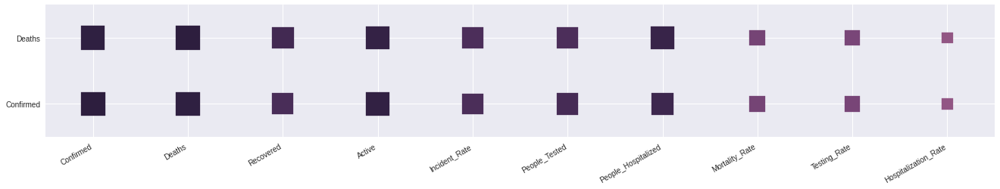

In [0]:
# Plotting a heatmap

def heatmap(x, y, size,color):
    fig, ax = plt.subplots(figsize=(20,3))
    
    # Mapping from column names to integer coordinates
    x_labels = corr_data.columns
    y_labels = ['Confirmed', 'Deaths']
    x_to_num = {p[1]:p[0] for p in enumerate(x_labels)} 
    y_to_num = {p[1]:p[0] for p in enumerate(y_labels)} 
    
    n_colors = 256 # Use 256 colors for the diverging color palette
    palette = sns.cubehelix_palette(n_colors) # Create the palette
    color_min, color_max = [-1, 1] # Range of values that will be mapped to the palette, i.e. min and max possible correlation

    def value_to_color(val):
        val_position = float((val - color_min)) / (color_max - color_min) # position of value in the input range, relative to the length of the input range
        ind = int(val_position * (n_colors - 1)) # target index in the color palette
        return palette[ind]

    
    ax.scatter(
    x=x.map(x_to_num),
    y=y.map(y_to_num),
    s=size * 1000,
    c=color.apply(value_to_color), # Vector of square color values, mapped to color palette
    marker='s'
)
    
    # Show column labels on the axes
    ax.set_xticks([x_to_num[v] for v in x_labels])
    ax.set_xticklabels(x_labels, rotation=30, horizontalalignment='right')
    ax.set_yticks([y_to_num[v] for v in y_labels])
    ax.set_yticklabels(y_labels)
    
    
    ax.set_xticks([t + 0.5 for t in ax.get_xticks()], minor=True)
    ax.set_yticks([t + 0.5 for t in ax.get_yticks()], minor=True)
    
    ax.set_xlim([-0.5, max([v for v in x_to_num.values()]) + 0.5]) 
    ax.set_ylim([-0.5, max([v for v in y_to_num.values()]) + 0.5])
    
corr = pd.melt(corr.reset_index(), id_vars='index') 
corr.columns = ['x', 'y', 'value']
heatmap(x=corr['x'],y=corr['y'],size=corr['value'].abs(),color=corr['value'])

### KMeans clustering to identify states with similar risk level for Covid-19

In [0]:
# data source: https://simple.wikipedia.org/wiki/List_of_U.S._states_by_population_density
density = pd.read_csv('https://raw.githubusercontent.com/MayaMM99/IST-718/master/FP/data/pop_density.csv')
density.head(2)

,state,density_mi
0,WA,104.9
1,IL,232.0


In [0]:
HTML('''<div class="flourish-embed flourish-chart" data-src="visualisation/2369366" data-url="https://flo.uri.sh/visualisation/2369366/embed"><script src="https://public.flourish.studio/resources/embed.js"></script></div>''')


In [0]:
# drop columbia 
dc = density['state'].str.contains('DC')
## Delete the ship data 
density= density[~(dc)]


In [0]:
# map the density
fig = go.Figure(data=go.Choropleth(
    locations=density['state'], 
    z = density['density_mi'].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'YlGnBu',
    #color=[1,2,3,4,5],
    colorbar_title = "Population Density"
))

fig.update_layout(
    title_text = 'USA Population Density',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

In [0]:
## Looks the same 
 # Initialize the map:
m = folium.Map(location=[37, -102], zoom_start=5)
 
# Add the color for the chloropleth:
m.choropleth(
 geo_data=state_geo,
 name='choropleth',
 data= density,
 columns=['state', 'density_mi'],
 key_on='feature.id',
 fill_color='YlGn',
 fill_opacity=0.7,
 line_opacity=0.2,
 legend_name='Density'
)
folium.LayerControl().add_to(m)
m
# Save to html
#m.save('#292_folium_chloropleth_USA1.html')


In [0]:
df_new = df.copy()
df_new= df_new.set_index('State_abb')
df_new = df_new.groupby(df_new.index).sum()

In [0]:
df_new.reset_index()

In [0]:
# merge by state 
merged_left = pd.merge(left=df_new,right=density, 
                         left_on=['State_abb'], 
                         right_on=['state'],
                         how='left')

In [0]:
merged_left.head(50)
merged_left= merged_left.dropna()

In [0]:
merged_left.dtypes

Lat                     float64
Lon                     float64
Confirmed                 int64
Deaths                    int64
Recovered                 int64
Active                    int64
Incident_Rate           float64
People_Tested             int64
People_Hospitalized       int64
Mortality_Rate          float64
Testing_Rate            float64
Hospitalization_Rate    float64
state                    object
density_mi              float64
dtype: object

In [0]:
# Creating dataset with numeric values
df_k =df_new[['Confirmed', 'Deaths', 'Recovered', 'Active', 'Incident_Rate', 'People_Tested', 'People_Hospitalized', 'Mortality_Rate', 'Testing_Rate', 'Hospitalization_Rate', 'density_mi']]

In [0]:
from sklearn.cluster import KMeans
#calculating WCSS which is the sum of squares of the distances of each data point represeting a country
#in all clusters to their respective centroids
wcss=[]
for i in range(1,11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10)
    y_means = kmeans.fit(df_k)
    wcss.append(y_means.inertia_)
#Plotting WCSS to find the number of clusters
plt.plot(range(1,11), wcss)
plt.xlabel("No. of clusters")
plt.ylabel(" Within Cluster Sum of Squares")
plt.show()

### Socio-Demographic Data 

In [124]:
# data source https://www.kaggle.com/roche-data-science-coalition/uncover
import datetime
from datetime import datetime
from datetime import timedelta

# get the data 
latest_date = datetime.today()- timedelta(days=2)
latest_date = latest_date.strftime('%m/%d/%y')[1:]

df_cases = pd.read_csv('https://usafactsstatic.blob.core.windows.net/public/data/covid-19/covid_confirmed_usafacts.csv')[['countyFIPS', 'County Name', 'State', latest_date]]
df_cases = df_cases.rename(columns={'countyFIPS': 'county_fips',
                                                  latest_date: 'confirmed'}).set_index('county_fips')

df_deaths = pd.read_csv('https://usafactsstatic.blob.core.windows.net/public/data/covid-19/covid_deaths_usafacts.csv')[['countyFIPS', latest_date]]
df_deaths = df_deaths.rename(columns={'countyFIPS': 'county_fips',
                                                  latest_date: 'deaths'}).set_index('county_fips')


df_pop = pd.read_csv('https://usafactsstatic.blob.core.windows.net/public/data/covid-19/covid_county_population_usafacts.csv')[['countyFIPS', 'population']]
df_pop = df_pop.rename(columns={'countyFIPS': 'county_fips'}).set_index('county_fips')

df = df_cases.join(df_deaths)
df = df.join(df_pop)

df = df[df.index > 999]
df = df[df.population>0]

del df_cases, df_deaths, df_pop

df['mortality'] = df['deaths']/ df['confirmed']
df['mortality'] = df['mortality'].fillna(0)

df['deaths_per_million'] = df['deaths'] * 1000000/ df['population']
df['cases_per_million'] = df['confirmed'] * 1000000/ df['population']

df['likely_infected_high'] = np.round(df['confirmed'] * 80/ df['population'], 2)
df['likely_infected_high'] = np.clip(df['likely_infected_high'], 0, 1)
df['likely_infected_low'] = np.round(df['confirmed'] * 28/ df['population'], 2)
df['likely_infected_low'] = np.clip(df['likely_infected_low'], 0, 1)

df['county_state'] = df['County Name'] + ', ' + df['State']
print('Number of counties: ' + str(df.index.nunique()))

Number of counties: 3142


In [125]:
df.head()

,County Name,State,confirmed,deaths,population,mortality,deaths_per_million,cases_per_million,likely_infected_high,likely_infected_low,county_state
county_fips,,,,,,,,,,,
1001,Autauga County,AL,159,3,55869.0,0.018868,53.697041,2845.943189,0.23,0.08,"Autauga County, AL"
1003,Baldwin County,AL,274,9,223234.0,0.032847,40.316439,1227.411595,0.10,0.03,"Baldwin County, AL"
1005,Barbour County,AL,110,1,24686.0,0.009091,40.508790,4455.966945,0.36,0.12,"Barbour County, AL"
1007,Bibb County,AL,59,1,22394.0,0.016949,44.654818,2634.634277,0.21,0.07,"Bibb County, AL"
1009,Blount County,AL,49,1,57826.0,0.020408,17.293259,847.369695,0.07,0.02,"Blount County, AL"


In [126]:
# data source https://www.kaggle.com/roche-data-science-coalition/uncover
df_county_stats= pd.read_csv('https://raw.githubusercontent.com/MayaMM99/IST-718/master/FP/data/us-county-health-rankings-2020.csv')[['fips',
                                                                                            'segregation_index',
                                                                                            'percent_black',
                                                                                            'median_household_income',
                                                                                            'percent_adults_with_obesity',
                                                                                            'percent_smokers',
                                                                                            'percent_adults_with_diabetes',                                           
                                                                                            'percent_with_access_to_exercise_opportunities',
                                                                                            'percent_some_college',
                                                                                            'percent_unemployed',
                                                                                            'percent_children_in_poverty',
                                                                                            'percent_female',
                                                                                            'percent_rural',
                                                                                            'percent_non_hispanic_white',
                                                                                            'food_environment_index',
                                                                                            'percent_food_insecure',
                                                                                            'income_ratio',
                                                                                            '80th_percentile_income',
                                                                                            'percent_excessive_drinking',
                                                                                            'average_number_of_physically_unhealthy_days',
                                                                                            'percent_uninsured',
                                                                                            'high_school_graduation_rate',
                                                                                            'percent_single_parent_households',
                                                                                            'social_association_rate',
                                                                                            'infant_mortality_rate',
                                                                                            'age_adjusted_death_rate',    ]]                                         


df_county_stats = df_county_stats.rename(columns={'fips': 'county_fips',
                                                  'segregation_index': 'segregation_level',
                                                  })
df_county_stats.head(2)

,county_fips,segregation_level,percent_black,median_household_income,percent_adults_with_obesity,percent_smokers,percent_adults_with_diabetes,percent_with_access_to_exercise_opportunities,percent_some_college,percent_unemployed,percent_children_in_poverty,percent_female,percent_rural,percent_non_hispanic_white,food_environment_index,percent_food_insecure,income_ratio,80th_percentile_income,percent_excessive_drinking,average_number_of_physically_unhealthy_days,percent_uninsured,high_school_graduation_rate,percent_single_parent_households,social_association_rate,infant_mortality_rate,age_adjusted_death_rate
0,1000,56.653988,26.497733,49881.0,35.5,20.927353,14.2,61.112287,60.411902,3.933567,23.9,51.633032,40.963183,65.413428,5.8,16.3,5.261136,99688.0,13.903515,4.918052,11.044783,89.3,37.342739,12.371924,8.365564,474.782349
1,1001,24.619138,19.343177,59338.0,33.3,18.081557,11.1,69.130124,62.009974,3.629079,19.3,51.448715,42.002162,74.308016,7.2,13.2,5.234597,110026.0,15.026031,4.743889,8.721686,90.0,26.242679,12.071202,7.940109,417.547551


In [127]:
# merge by state 
df = pd.merge(left=df ,right=df_county_stats, 
                         left_on=['county_fips'], 
                         right_on=['county_fips'],
                         how='left')
df.head(4)

,county_fips,County Name,State,confirmed,deaths,population,mortality,deaths_per_million,cases_per_million,likely_infected_high,likely_infected_low,county_state,segregation_level,percent_black,median_household_income,percent_adults_with_obesity,percent_smokers,percent_adults_with_diabetes,percent_with_access_to_exercise_opportunities,percent_some_college,percent_unemployed,percent_children_in_poverty,percent_female,percent_rural,percent_non_hispanic_white,food_environment_index,percent_food_insecure,income_ratio,80th_percentile_income,percent_excessive_drinking,average_number_of_physically_unhealthy_days,percent_uninsured,high_school_graduation_rate,percent_single_parent_households,social_association_rate,infant_mortality_rate,age_adjusted_death_rate
0,1001,Autauga County,AL,159,3,55869.0,0.018868,53.697041,2845.943189,0.23,0.08,"Autauga County, AL",24.619138,19.343177,59338.0,33.3,18.081557,11.1,69.130124,62.009974,3.629079,19.3,51.448715,42.002162,74.308016,7.2,13.2,5.234597,110026.0,15.026031,4.743889,8.721686,90.000000,26.242679,12.071202,7.940109,417.547551
1,1003,Baldwin County,AL,274,9,223234.0,0.032847,40.316439,1227.411595,0.10,0.03,"Baldwin County, AL",41.271763,8.783976,57588.0,31.0,17.489033,10.7,73.713549,67.371620,3.615382,13.9,51.538377,42.279099,83.111337,8.0,11.6,4.417767,111447.0,17.958310,4.224519,11.333404,86.361577,24.139601,10.205617,5.546701,353.343111
2,1005,Barbour County,AL,110,1,24686.0,0.009091,40.508790,4455.966945,0.36,0.12,"Barbour County, AL",25.039132,48.032635,34382.0,41.7,21.999985,17.6,53.166770,34.857649,5.171384,43.9,47.216752,67.789635,45.641252,5.6,22.0,5.681410,76557.0,12.844016,5.430279,12.242792,81.410256,56.603426,7.518797,NaN,497.350062
3,1007,Bibb County,AL,59,1,22394.0,0.016949,44.654818,2634.634277,0.21,0.07,"Bibb County, AL",52.603794,21.120536,46064.0,37.6,19.114200,14.5,16.251364,44.137353,3.971828,27.8,46.781250,68.352607,74.589286,7.8,14.3,4.368581,87957.0,15.570042,4.591482,10.206253,83.763838,28.689236,8.381860,12.244898,589.041117


In [0]:
# data sourse https://www.countyhealthrankings.org/explore-health-rankings/rankings-data-documentation
df_county_stats = pd.read_csv('https://raw.githubusercontent.com/MayaMM99/IST-718/master/FP/data/analytic_data2020.csv')[['fipscode',
                                                                                            'v052_rawvalue',
                                                                                            'v053_rawvalue',
                                                                                            'v044_rawvalue',
                                                                                            'v147_rawvalue',
                                                                                            'v002_cilow',
                                                                                            'v136_other_data_2']]

df_county_stats = df_county_stats.rename(columns={'fipscode': 'county_fips',
                                                  'v052_rawvalue': 'percent_below_18',
                                                  'v053_rawvalue': 'percent_above_65',
                                                  'v044_rawvalue': 'income_inequality',
                                                  'v147_rawvalue': 'life_expectancy',
                                                  'v002_cilow': 'poor_fair_health',
                                                  'v136_other_data_2': 'over_crowding'
                                                  }).set_index('county_fips')


df = df.join(df_county_stats)
df = df.reset_index()
df['county_fips'] = df['county_fips'].astype(str).str.rjust(5,'0')
#df.head()

In [129]:
df.head()

,index,county_fips,County Name,State,confirmed,deaths,population,mortality,deaths_per_million,cases_per_million,likely_infected_high,likely_infected_low,county_state,segregation_level,percent_black,median_household_income,percent_adults_with_obesity,percent_smokers,percent_adults_with_diabetes,percent_with_access_to_exercise_opportunities,percent_some_college,percent_unemployed,percent_children_in_poverty,percent_female,percent_rural,percent_non_hispanic_white,food_environment_index,percent_food_insecure,income_ratio,80th_percentile_income,percent_excessive_drinking,average_number_of_physically_unhealthy_days,percent_uninsured,high_school_graduation_rate,percent_single_parent_households,social_association_rate,infant_mortality_rate,age_adjusted_death_rate,percent_below_18,percent_above_65,income_inequality,life_expectancy,poor_fair_health,over_crowding
0,0,01001,Autauga County,AL,159,3,55869.0,0.018868,53.697041,2845.943189,0.23,0.08,"Autauga County, AL",24.619138,19.343177,59338.0,33.3,18.081557,11.1,69.130124,62.009974,3.629079,19.3,51.448715,42.002162,74.308016,7.2,13.2,5.234597,110026.0,15.026031,4.743889,8.721686,90.000000,26.242679,12.071202,7.940109,417.547551,0.224348,0.160258,4.920018,79.08913,NaN,NaN
1,1,01003,Baldwin County,AL,274,9,223234.0,0.032847,40.316439,1227.411595,0.10,0.03,"Baldwin County, AL",41.271763,8.783976,57588.0,31.0,17.489033,10.7,73.713549,67.371620,3.615382,13.9,51.538377,42.279099,83.111337,8.0,11.6,4.417767,111447.0,17.958310,4.224519,11.333404,86.361577,24.139601,10.205617,5.546701,353.343111,NaN,NaN,NaN,NaN,NaN,NaN
2,2,01005,Barbour County,AL,110,1,24686.0,0.009091,40.508790,4455.966945,0.36,0.12,"Barbour County, AL",25.039132,48.032635,34382.0,41.7,21.999985,17.6,53.166770,34.857649,5.171384,43.9,47.216752,67.789635,45.641252,5.6,22.0,5.681410,76557.0,12.844016,5.430279,12.242792,81.410256,56.603426,7.518797,NaN,497.350062,NaN,NaN,NaN,NaN,NaN,NaN
3,3,01007,Bibb County,AL,59,1,22394.0,0.016949,44.654818,2634.634277,0.21,0.07,"Bibb County, AL",52.603794,21.120536,46064.0,37.6,19.114200,14.5,16.251364,44.137353,3.971828,27.8,46.781250,68.352607,74.589286,7.8,14.3,4.368581,87957.0,15.570042,4.591482,10.206253,83.763838,28.689236,8.381860,12.244898,589.041117,NaN,NaN,NaN,NaN,NaN,NaN
4,4,01009,Blount County,AL,49,1,57826.0,0.020408,17.293259,847.369695,0.07,0.02,"Blount County, AL",48.214823,1.462656,50412.0,33.8,19.208672,17.0,15.634486,53.361073,3.511157,18.0,50.726141,89.951502,86.886238,8.4,10.7,4.430262,91702.0,14.230594,4.860808,13.360759,93.468795,28.561828,8.446383,6.841993,515.611823,NaN,NaN,NaN,NaN,NaN,NaN


In [0]:
"""from google.colab import drive
drive.mount('/content/drive')"""

In [0]:
#df.to_csv('/content/drive/My Drive/IST 718/big_df.csv')

**Demographic Variables**: 
Gender,
Rural-Urban,
Age,
Race,
Single-parent households,

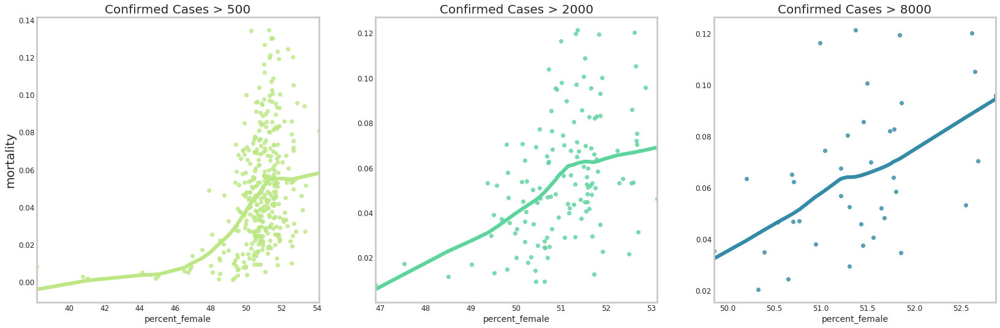

In [133]:
# Gender
plt.figure(figsize=(25,8))
val = [500, 2000, 8000]
colors = [cnf, dth, rec]
col_name = 'percent_female'


for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.regplot(df[df.confirmed>val[i]][col_name], df[df.confirmed>val[i]].mortality,lowess=True, color=colors[i])
    plt.title('Confirmed Cases > ' + str(val[i]),fontsize=20)
    plt.xlabel(col_name)
    plt.ylabel('mortality', fontsize=20)
    plt.grid(False)
    if i%3 !=0:
            plt.ylabel(' ')

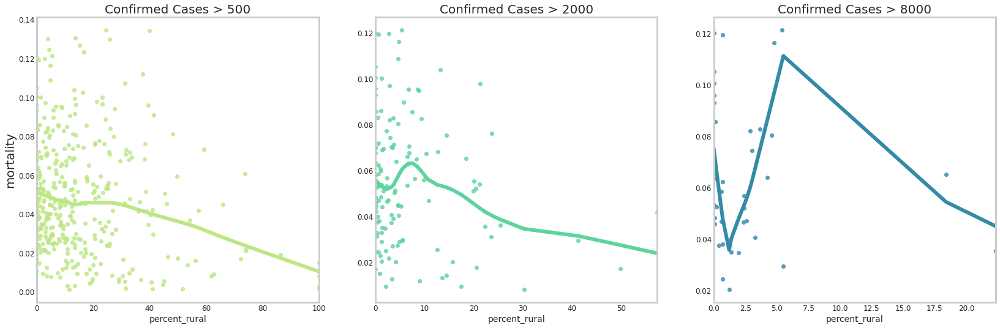

In [134]:
# outsite cities teritory
#rural
col_name = 'percent_rural'
plt.figure(figsize=(25,8))


for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.regplot(df[df.confirmed>val[i]][col_name], df[df.confirmed>val[i]].mortality,lowess=True, color=colors[i])
    plt.title('Confirmed Cases > ' + str(val[i]), fontsize=20)
    plt.xlabel(col_name)
    plt.ylabel('mortality', fontsize=20)
    plt.grid(False)
    if i%3 !=0:
            plt.ylabel(' ')

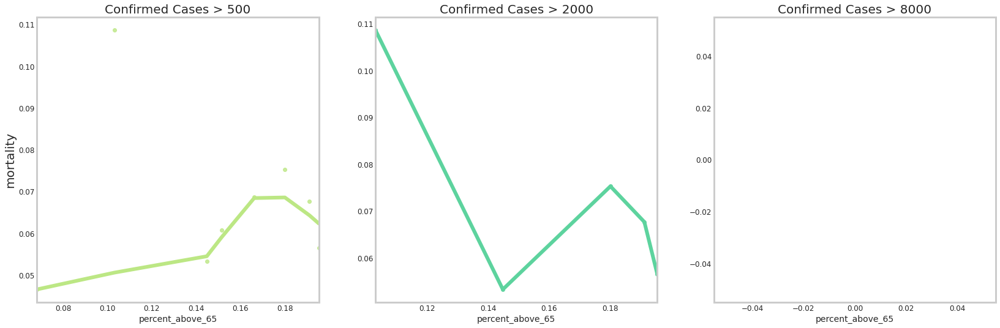

In [135]:
# Age above 65
#age above 65
col_name = 'percent_above_65'
plt.figure(figsize=(25,8))


for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.regplot(df[df.confirmed>val[i]][col_name], df[df.confirmed>val[i]].mortality,lowess=True, color=colors[i])
    plt.title('Confirmed Cases > ' + str(val[i]), fontsize=20)
    plt.xlabel(col_name)
    plt.ylabel('mortality', fontsize=20)
    plt.grid(False)
    if i%3 !=0:
            plt.ylabel(' ')


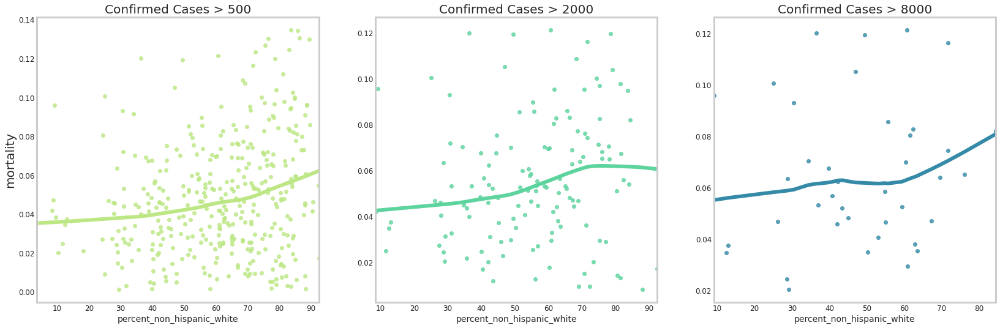

In [137]:
# Race 

plt.figure(figsize=(25,8))
col_name = 'percent_non_hispanic_white'


for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.regplot(df[df.confirmed>val[i]][col_name], df[df.confirmed>val[i]].mortality,lowess=True, color=colors[i])
    plt.title('Confirmed Cases > ' + str(val[i]))
    plt.xlabel(col_name)
    plt.ylabel('mortality', fontsize=20)
    plt.grid(False)
    if i%3 !=0:
            plt.ylabel(' ')

The lowess smoothed lines provide some insight into the nature of the relationship between covid-related mortalities and demographic variables like gender, age, and race. As I filtered for counties having a higher number of confiemed cases, we notice that certain variables reveal a stronger positive association with Covid-related mortality.

**Economic Variables**:
Income Ratio,
Uninsured,
Unemployed,
segregation level,
Food insecure

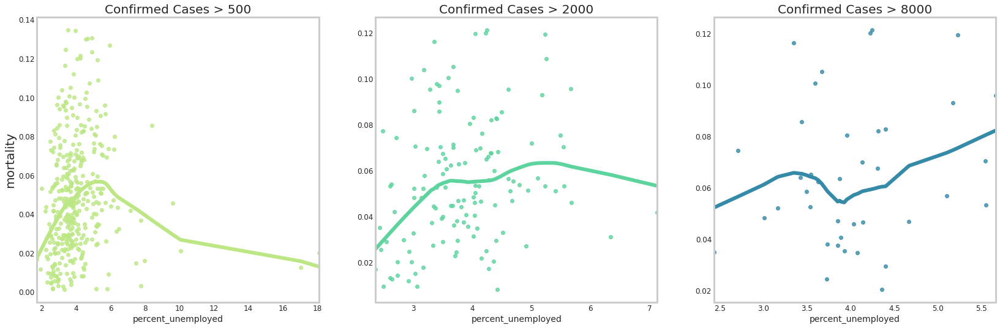

In [138]:
# Unemployed

col_name = 'percent_unemployed'
plt.figure(figsize=(25,8))


for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.regplot(df[df.confirmed>val[i]][col_name], df[df.confirmed>val[i]].mortality,lowess=True, color=colors[i])
    plt.title('Confirmed Cases > ' + str(val[i]))
    plt.xlabel(col_name)
    plt.grid(False)
    plt.ylabel('mortality', fontsize=20)
    if i%3 !=0:
            plt.ylabel(' ')

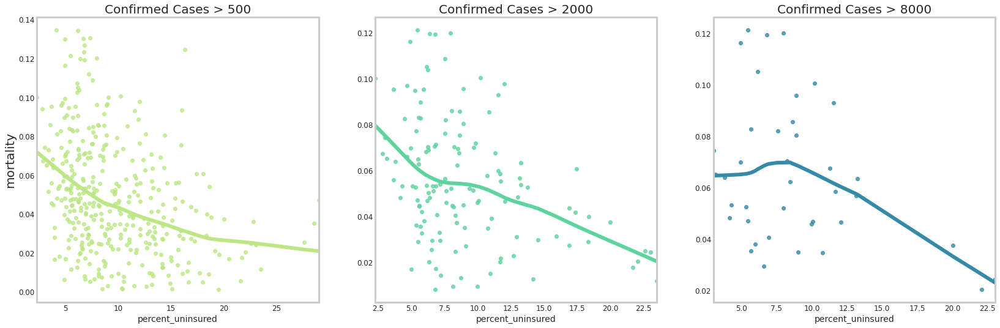

In [139]:
# Unensured

col_name = 'percent_uninsured'
plt.figure(figsize=(25,8))


for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.regplot(df[df.confirmed>val[i]][col_name], df[df.confirmed>val[i]].mortality,lowess=True, color=colors[i])
    plt.title('Confirmed Cases > ' + str(val[i]))
    plt.xlabel(col_name)
    plt.grid(False)
    plt.ylabel('mortality', fontsize=20)
    if i%3 !=0:
            plt.ylabel(' ')

**Health Variables**:
Smokers, Alcohol, diabetes, life expectancy, infant moratlity rate, Social Association Rate


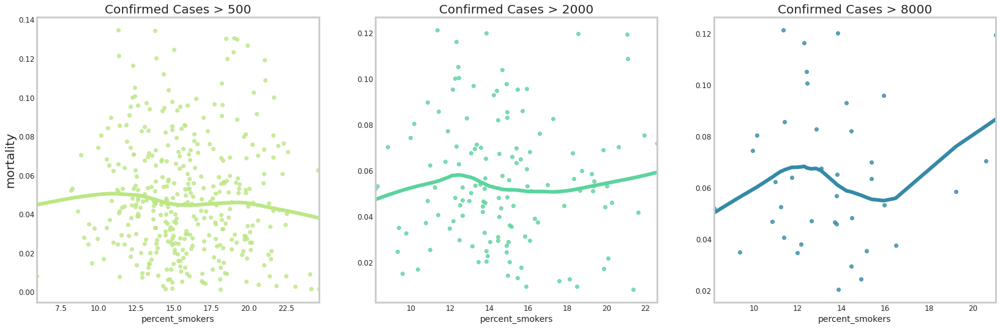

In [140]:
# Smokers

col_name = 'percent_smokers'
plt.figure(figsize=(25,8))


for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.regplot(df[df.confirmed>val[i]][col_name], df[df.confirmed>val[i]].mortality,lowess=True, color=colors[i])
    plt.title('Confirmed Cases > ' + str(val[i]))
    plt.xlabel(col_name)
    plt.grid(False)
    plt.ylabel('mortality', fontsize=20)
    if i%3 !=0:
            plt.ylabel(' ')

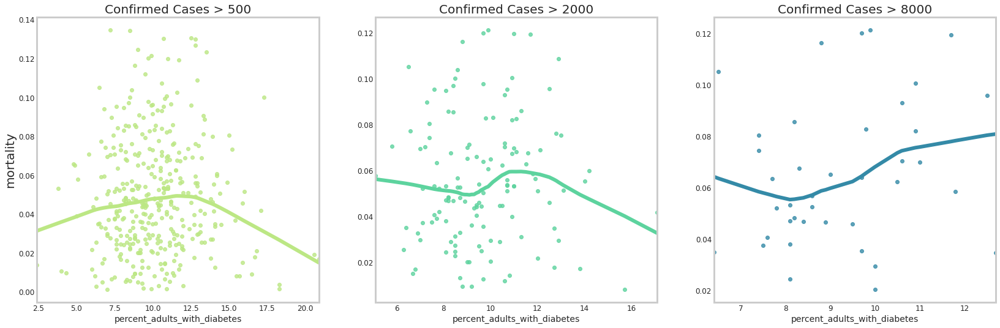

In [141]:
# Diabetes
col_name = 'percent_adults_with_diabetes'
plt.figure(figsize=(25,8))


for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.regplot(df[df.confirmed>val[i]][col_name], df[df.confirmed>val[i]].mortality,lowess=True, color=colors[i])
    plt.title('Confirmed Cases > ' + str(val[i]))
    plt.xlabel(col_name)
    plt.grid(False)
    plt.ylabel('mortality', fontsize=20)
    if i%3 !=0:
            plt.ylabel(' ')

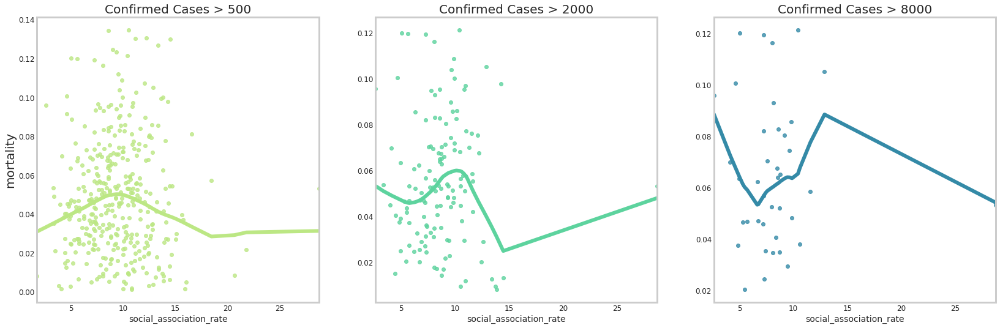

In [142]:
# Soc association 

col_name = 'social_association_rate'
plt.figure(figsize=(25,8))


for i in range(3):
    plt.subplot(1, 3, i+1)
    sns.regplot(df[df.confirmed>val[i]][col_name], df[df.confirmed>val[i]].mortality,lowess=True, color=colors[i])
    plt.title('Confirmed Cases > ' + str(val[i]))
    plt.xlabel(col_name)
    plt.grid(False)
    plt.ylabel('mortality', fontsize=20)
    if i%3 !=0:
            plt.ylabel(' ')

### Global Mobility Data 

In [156]:
df_mobility
df_mobility = df_mobility.drop(columns=['sub_region_1', 'sub_region_2'])
df_mobility.head(2)

,country_region_code,country_region,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
0,AE,United Arab Emirates,2/15/2020,0.0,4.0,5.0,0.0,2.0,1.0
1,AE,United Arab Emirates,2/16/2020,1.0,4.0,4.0,1.0,2.0,1.0


In [0]:
# remove missing values
df_mobility.dropna(subset=['date'],axis='rows',inplace=True)

df_mobility['date'] = pd.to_datetime(df_mobility.date)
# change date format
df_mobility['pdate']=pd.to_datetime(df_mobility.date)
df_mobility["dayofweek"]=df_mobility.pdate.dt.dayofweek

#df.date=df.date.dt.strftime("%Y-%m-%d")
gr_region=df_mobility.groupby("country_region")
gr_date=df_mobility.groupby("date")
df_region=gr_region.sum()
df_date=gr_date.sum()

In [0]:
#df_region
#df_date

In [163]:
df_mob = df_mobility[df_mobility['country_region'] == 'United States']
df_mob.head(2)

,country_region_code,country_region,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline,pdate,dayofweek
103361,US,United States,2020-02-15,6.0,2.0,15.0,3.0,2.0,-1.0,2020-02-15,5
103362,US,United States,2020-02-16,7.0,1.0,16.0,2.0,0.0,-1.0,2020-02-16,6


In [0]:
# Plot it
plt.figure(figsize=(24,10))
plot1=sns.lineplot(x=df_date.index,y='value',data=df_date)
plot1.set_xticklabels(df_date.index,rotation=90)
plot1.set_title("Trend of Direction request")

In [0]:
df_mob.isna().sum()

country_region_code                                        0
country_region                                             0
date                                                       0
retail_and_recreation_percent_change_from_baseline     56527
grocery_and_pharmacy_percent_change_from_baseline      63637
parks_percent_change_from_baseline                    169151
transit_stations_percent_change_from_baseline         139807
workplaces_percent_change_from_baseline                 9933
residential_percent_change_from_baseline              124757
dtype: int64

In [0]:
# Get regional mobility
df_Rmob = pd.read_csv('https://raw.githubusercontent.com/MayaMM99/IST-718/master/FP/data/regional-mobility.csv')
df_Rmob.head(2)

,country,region,date,retail,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
0,United Arab Emirates,Total,2020-02-15,0.0,4.0,5.0,0.0,2.0,1.0
1,United Arab Emirates,Total,2020-02-16,1.0,4.0,4.0,1.0,2.0,1.0


In [0]:
df_Rmob.isna().sum()

country                     0
region                      0
date                        0
retail                   3670
grocery_and_pharmacy     5096
parks                   15581
transit_stations        12968
workplaces               1242
residential             16256
dtype: int64

In [0]:
df_Rmob[3:].fillna(0, inplace=True)


In [0]:
# Subset US
df_Rmob= df_Rmob[df_Rmob['country']=='United States']
df_Rmob

,country,region,date,retail,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
73563,United States,Total,2020-02-15,6.0,2.0,15.0,3.0,2.0,-1.0
73564,United States,Total,2020-02-16,7.0,1.0,16.0,2.0,0.0,-1.0
73565,United States,Total,2020-02-17,6.0,0.0,28.0,-9.0,-24.0,5.0
73566,United States,Total,2020-02-18,0.0,-1.0,6.0,1.0,0.0,1.0
73567,United States,Total,2020-02-19,2.0,0.0,8.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...
76522,United States,Wyoming,2020-04-07,-32.0,-5.0,15.0,-13.0,-37.0,14.0
76523,United States,Wyoming,2020-04-08,-32.0,-4.0,26.0,-12.0,-38.0,14.0
76524,United States,Wyoming,2020-04-09,-32.0,-5.0,33.0,-13.0,-38.0,14.0
76525,United States,Wyoming,2020-04-10,-33.0,1.0,44.0,-10.0,-41.0,16.0


In [148]:
df_melt = pd.melt(df_Rmob, id_vars=['date'], value_vars=['retail', 'grocery_and_pharmacy', 'parks', 'transit_stations', 'workplaces', 'residential'])
df_melt.head(2)

,date,variable,value
0,2020-02-15,retail,6.0
1,2020-02-16,retail,7.0


### Predictions

#### **Logistic Curve**

In [0]:
from scipy.optimize import curve_fit
# We want number of confirmed for each date for each state


df_l = df[df['Date']<"5/14/2020"]

state_data = pd.pivot_table(df_l, values=['Confirmed', 'Recovered','Deaths'], index=['Date'], aggfunc=np.sum)
state_data.tail()

,Confirmed,Deaths,Recovered
Date,,,
5/1/2020,1067508,62890,153753
5/10/2020,1306990,78673,212341
5/11/2020,1326674,79401,215974
5/12/2020,1345234,80554,232537
5/13/2020,1366883,82246,230090


In [0]:
# x_data is number of days since first confirmed and y_data is confirmed data
x_data = range(len(state_data.index))
y_data = state_data['Confirmed']

def log_curve(x, k, x_0, ymax):
    return ymax / (1 + np.exp(-k*(x-x_0)))

# Fit the curve
popt, pcov = curve_fit(log_curve, x_data, y_data, bounds=([0,0,0],np.inf), maxfev=50000)
estimated_k, estimated_x_0, ymax= popt


# Plot the fitted curve
k = estimated_k
x_0 = estimated_x_0
y_fitted = log_curve(range(0,160), k, x_0, ymax)
print(k, x_0, ymax)
#print(y_fitted)
y_data.tail()

0.4215729254699261 55.935517732926016 798108.456845909


Date
5/1/2020     1067508
5/10/2020    1306990
5/11/2020    1326674
5/12/2020    1345234
5/13/2020    1366883
Name: Confirmed, dtype: int64

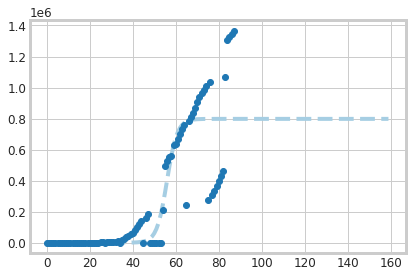

In [0]:
# Plot everything for illustration
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(range(0,160), y_fitted, '--', label='fitted')
ax.plot(x_data, y_data, 'o', label='Confirmed Data')

Notice that this predicts the US hit the inflection point around day 56 (it is currently day 124 as of May 25h) and this model predicts that the number of confirmed cases will max out around 837262 cases. This is certainly underestimating. We should also consider that the number of positive undiagnosed plus positive diagnosed cases in each country is likely to be much higher than the number of confirmed cases. This, along with the fact that most countries aren't testing enough, means the mortality rate is likely inflated since the number of actual positive cases in each population is likely considerably higher than confirmed cases

#### **Prophet**

In [0]:
case_df = pd.DataFrame(df.groupby('Date')['Confirmed'].sum().reset_index()).rename(columns={'Date': 'ds', 'Confirmed': 'y'})
death_df = pd.DataFrame(df.groupby('Date')['Deaths'].sum().reset_index()).rename(columns={'Date': 'ds', 'Deaths': 'y'})

In [0]:
case_df.head(2)

,ds,y
0,2020-01-22,1
1,2020-01-23,1


In [0]:
m = Prophet()
m.fit(case_df)
m1 = Prophet()
m1.fit(death_df)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [0]:
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
forecast1 = m1.predict(future)

In [0]:
from fbprophet.plot import plot_plotly
fig = plot_plotly(m, forecast)
annotations = []
annotations.append(dict(xref='paper', yref='paper', x=0.0, y=1.05,
                              xanchor='left', yanchor='bottom',
                              text='Predictions for Total cases in US State',
                              font=dict(family='Arial',
                                        size=30,
                                        color='rgb(37,37,37)'),
                              showarrow=False))
fig.update_layout(annotations=annotations)
fig

In [0]:
fig = plot_plotly(m, forecast1)
annotations = []
annotations.append(dict(xref='paper', yref='paper', x=0.0, y=1.05,
                              xanchor='left', yanchor='bottom',
                              text='Predictions for Total Death in US State',
                              font=dict(family='Arial',
                                        size=30,
                                        color='rgb(37,37,37)'),
                              showarrow=False))
fig.update_layout(annotations=annotations)
fig

#### **ARIMA**

In [0]:
# ARIMA functions
# define a function to run auto arima and search for best model parameters
def find_orders(ts, exog=None):

    stepwise_model = pm.auto_arima(ts, start_p=1, start_q=1, max_p=4, max_q=14,
                                exogenous=exog, 
                                m=12, seasonal=True, stationary=False,
                                stepwise=True, trend='ct',
                                suppress_warnings=True, trace=False, 
                                error_action='ignore')

    return stepwise_model.order, stepwise_model.seasonal_order

def fit_sarimax_model(ts, exog=None, order=(1,1,1), seasonal_order=(0, 0, 0, 12), summary=True, plot=True):
  
    # fit model with exog
    model = sm.tsa.statespace.SARIMAX(ts, 
                                  exog = exog,  
                                  order=order,
                                  seasonal_order=seasonal_order,
                                  trend='ct',
                                  enforce_stationarity=True,
                                  enforce_invertibility=False)

    output = model.fit(d=0)
    
    if summary==True:
        print(output.summary())

    if plot==True:
        # plot model diagnostics
        output.plot_diagnostics(figsize=(15, 18))
        plt.show()
        
    return output

def get_predictions(test, exog, model_output, plot=True, show=True):
    
    # Use the model to forecast twelve months into 2018 and store the confidence intervals
    pred = model_output.get_prediction(start=pd.to_datetime('2019-01-31'), end=pd.to_datetime('2019-12-31'), dynamic=False, exog=exog)
    pred_ci = pred.conf_int()
    
    # Plot the actual results for 2018 vs the projected results. 
    ax = test['2019-01-31':].plot(label='observed')
    pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(8,6))
    
    
    if plot:
        #Plot observed and predicted values with confidence interval
        ax.fill_between(pred_ci.index,
                    pred_ci.iloc[:, 0],
                    pred_ci.iloc[:, 1], color='k', alpha=.2)

        ax.set_xlabel('Date')
        ax.set_ylabel('Household Value')
        plt.legend(loc='upper left')
        plt.show()

    
    if show:
        
        # Obtain the predicted mean, merge with the actual values, and compute the MSE. 
        y_pred = pred.predicted_mean.reset_index()
        y_pred.columns = ['date', 'value']
        
        y_test = test.reset_index()
        
        # Compute the mean square error / RMSE
        mse = mean_squared_error(y_test.value, y_pred.value)

        rmse = math.sqrt(mse)
        r2 = r2_score(y_test.value, y_pred.value)

        # Print the results. 
        print('RMSE: ' +  str(format(round(rmse, 3))))
        print('R-squared: ' + str(format(round(r2, 3))))

def get_future(ds, exog, steps, model_output, plot):

    # Get forecast and confidence interval from base model, by steps 60
    

    #future_1y= model_output.forecast(steps=12, exog=exog)
    future_1y = model_output.get_forecast(steps=steps, exog=exog, dynamic=True)
    future_conf_1y = future_1y.conf_int(steps=steps)

    print(future_1y.predicted_mean)

    if plot: # plot results

        # 1 yr
        ax = ds.plot(label='Observed', figsize=(12, 8))
        future_1y.predicted_mean.plot(ax=ax, label='Forecast')
        ax.fill_between(future_conf_1y.index,
                        future_conf_1y.iloc[:, 0],
                        future_conf_1y.iloc[:, 1], color='k', alpha=.25)
        ax.xaxis.set_minor_locator(mdates.DayLocator())
        ax.set_xlabel('Date')
        ax.set_ylabel('Returns')
        ax.set_title('1-Year Forecast')
        ax.legend()
        plt.show()        

    df_out = future_conf_1y
    df_out['yhat'] = future_1y.predicted_mean
    df_out.columns = ['yhat_lower', 'yhat_upper', 'yhat']


    gain_df = pd.DataFrame({'value':df_out['yhat'].values, 'date':df_out.index})
    lastObs = pd.DataFrame({'value':ds.iloc[-1]['value'], 'date':ds.index[-1]}, index=[0])

    # preappend one row from actuals to forecast so that roi can be projected.
    gain_df = pd.concat([ lastObs, gain_df])
    gain_df = gain_df.set_index('date')

    roi = calculate_gain(gain_df, steps=steps, plot=False)

    print(str(steps) + '-Step ROI: ' + str(roi.iloc[0,0]))
    return (df_out)

# function to calculate gain percentage (ROI) on previous 2, 5 and 10 years
# source: https://github.com/gioamorim80/Zillow-Time-Series/blob/master/Module%204%20Final%20Project.ipynb
def calculate_gain(ts, steps=12, plot=True): 
    
    '''Takes a time series and performs calculations on returns over investments
    for period of 1 year'''
    
    # calculates ROI by taking current value, decreasing investment(value at x steps in past) and 
    # dividing by investment. Multiplies by 100 to get percentage number
    roi_1 = (ts - ts.shift(periods=steps))/ts.shift(periods=steps)*100
    roi_1.dropna(inplace=True)  

    # plot results
    if plot:
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=roi_1.index, y=roi_1.value, name='1-Year Investment',
                                 line_color='deepskyblue'))
        
        fig.update_layout(title_text='ROI',
                          yaxis_title="ROI (%)", 
                          xaxis_rangeslider_visible=False)
        fig.show()
    
    # saves new ts with returns for 1 period
    return roi_1

In [0]:
# need more data 
